# Consistency Distillation — MicroDiT (EDM)



In [3]:
import os, sys

SCRIPTS_DIR = '/kaggle/input/datasets/albertdavletshin/consistency-distillation-micro-diffusion'
sys.path.insert(0, SCRIPTS_DIR)
os.chdir(SCRIPTS_DIR)


In [6]:
#!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 41.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.5 MB/s eta 0:00:00


In [4]:
import sys, os, copy, gc
import torch
import numpy as np
import random
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from accelerate import Accelerator
from accelerate.utils import set_seed
from diffusers.optimization import get_scheduler

sys.path.insert(0, '/kaggle/input/datasets/albertdavletshin/micro-diffusers')
from micro_diffusion.models.model import create_latent_diffusion

from cd_utils import get_sigmas, cd_loss
from dataset import get_dataloader
from sampler import generate_images, run_parti_prompts_benchmark

print(f"torch {torch.__version__}, CUDA: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    gpu_mem = torch.cuda.mem_get_info(0)[1] / 1e9
    print(f"GPU: {torch.cuda.get_device_name(0)}, {gpu_mem:.1f} GB")

torch 2.6.0+cu124, CUDA: True
GPU: NVIDIA H100 80GB HBM3, 85.0 GB


## Config

In [76]:
SCRIPTS_DIR = '/kaggle/input/datasets/albertdavletshin/consistency-distillation-micro-diffusion'
TEACHER_CHECKPOINT = "/kaggle/working/dit_4_channel_0.5B_synthetic_data.pt"
DATA_DIR = "/kaggle/working/data/journeydb_subset"
OUTPUT_DIR = "/kaggle/working/output"

LATENT_RES = 64
IN_CHANNELS = 4
POS_INTERP_SCALE = 2.0

NUM_TIMESTEPS = 50
GUIDANCE_SCALE = 5.0
LOSS_TYPE = "huber"
HUBER_C = 0.001

LEARNING_RATE = 1e-5
TRAIN_BATCH_SIZE = 2
GRADIENT_ACCUMULATION_STEPS = 4
MAX_TRAIN_STEPS = 10000
MIXED_PRECISION = "fp16"
SEED = 42
MAX_GRAD_NORM = 1.0
LR_WARMUP_STEPS = 500
RESOLUTION = 512

VALIDATION_STEPS = 500
SAVE_STEPS = 10000

VALIDATION_PROMPTS = [
    "A beautiful sunset over mountains with a clear lake, highly detailed",
    "Portrait of a girl with golden hair, 8k, masterpiece",
    "Astronaut floating in space with Earth in background",
    "A cute corgi puppy playing in autumn leaves, photograph",
    "Cyberpunk city at night, neon lights, rain, cinematic",
    "Oil painting of a medieval castle on a cliff, dramatic lighting",
    "Close-up of a steaming coffee cup on a wooden table, morning light",
    "A red sports car driving on an empty highway at dusk",
]
VALIDATION_RANDOM_N = 0

LR_SCHEDULER_TYPE = "cosine" 
MIN_LR_RATIO = 0.1  

os.makedirs(OUTPUT_DIR, exist_ok=True)

## Data Preparation

Download prompts from JourneyDB and choose 5k

In [ ]:
import json
from datasets import load_dataset
from PIL import Image
import tarfile
from huggingface_hub import login, hf_hub_download

NUM_SAMPLES = 5000

HF_TOKEN = 'hf_token'
if HF_TOKEN:
    login(token=HF_TOKEN)

if os.path.exists(DATA_DIR) and os.path.exists(os.path.join(DATA_DIR, "captions.json")):
    n = len(json.load(open(os.path.join(DATA_DIR, "captions.json"))))
    print(f"Dataset already exists: {n} samples in {DATA_DIR}")
else:
    images_dir = os.path.join(DATA_DIR, "images")
    os.makedirs(images_dir, exist_ok=True)
    
    print("Loading prompts from JourneyDB...")
    all_prompts = []
    
    try:
        anno_path = hf_hub_download(
            repo_id="JourneyDB/JourneyDB",
            filename="data/train/train_anno_realease_repath.jsonl.tgz",
            repo_type="dataset",
            token=HF_TOKEN
        )
        
        with tarfile.open(anno_path, 'r:gz') as tar:
            for member in tar.getmembers():
                if member.name.endswith('.jsonl'):
                    f = tar.extractfile(member)
                    if f:
                        for line in f:
                            try:
                                data = json.loads(line.decode('utf-8'))
                                prompt = data.get('prompt', data.get('text', ''))
                                if prompt and isinstance(prompt, str) and len(prompt.strip()) > 0:
                                    all_prompts.append(prompt.strip())
                            except:
                                continue
        
        print(f"Loaded {len(all_prompts)} prompts from JourneyDB")
        
        random.seed(SEED)
        if len(all_prompts) > NUM_SAMPLES:
            selected_prompts = random.sample(all_prompts, NUM_SAMPLES)
            print(f"Randomly selected {NUM_SAMPLES} prompts from {len(all_prompts)} total")
        else:
            selected_prompts = all_prompts
            print(f"Using all {len(selected_prompts)} available prompts")
        
        print("\nExample prompts (first 10):")
        for i, prompt in enumerate(selected_prompts[:10]):
            print(f"  {i+1}. {prompt[:100]}{'...' if len(prompt) > 100 else ''}")
        
        with open(os.path.join(DATA_DIR, "prompts_to_generate.json"), 'w') as f:
            json.dump(selected_prompts, f, indent=2)
        print(f"\nSaved {len(selected_prompts)} prompts to {DATA_DIR}/prompts_to_generate.json")
        print("After loading the teacher model, run the generation cell to create training data.")
        
    except Exception as e:
        print(f"Error loading JourneyDB prompts: {e}")
        print("Please check your HF_TOKEN and ensure you have access to JourneyDB dataset.")
        raise

Dataset already exists: 0 samples in /kaggle/working/data/journeydb_subset


## Model Init

In [79]:
!wget -q -O {TEACHER_CHECKPOINT} https://huggingface.co/VSehwag24/MicroDiT/resolve/main/ckpts/dit_4_channel_0.5B_synthetic_data.pt

model = create_latent_diffusion(
    latent_res=LATENT_RES, in_channels=IN_CHANNELS,
    pos_interp_scale=POS_INTERP_SCALE, dtype='float32'
)
model.dit.load_state_dict(torch.load(TEACHER_CHECKPOINT, map_location='cpu'))
print(f"DiT: {sum(p.numel() for p in model.dit.parameters()) / 1e6:.1f}M params")

DiT: 1165.4M params


In [25]:

from micro_diffusion.models.utils import DATA_TYPES
from PIL import Image

def patch_openclip_encoder(model):
    if not (hasattr(model.text_encoder, 'encoder') and 
            hasattr(model.text_encoder.encoder, 'clip_model')):
        print("No OpenCLIP encoder found, skipping patch")
        return None
    
    clip_model = model.text_encoder.encoder.clip_model
    original_fxn = model.text_encoder.encoder.forward_fxn
    
    first_block = clip_model.transformer.resblocks[0]
    batch_first = getattr(first_block.attn, 'batch_first', False)
    print(f"OpenCLIP transformer: batch_first={batch_first}")
    
    def patched_forward_fxn(text):
        cast_dtype = clip_model.transformer.get_cast_dtype()
        x = clip_model.token_embedding(text).to(cast_dtype)
        x = x + clip_model.positional_embedding.to(cast_dtype)
        
        attn_mask = clip_model.attn_mask
        if attn_mask is not None:
            attn_mask = attn_mask.to(device=x.device, dtype=x.dtype)
        
        if batch_first:
            x = clip_model.transformer(x, attn_mask=attn_mask)
        else:
            x = x.permute(1, 0, 2)
            x = clip_model.transformer(x, attn_mask=attn_mask)
            x = x.permute(1, 0, 2)
        
        x = clip_model.ln_final(x)
        x = x.unsqueeze(dim=1)
        return x, None
    
    model.text_encoder.encoder.forward_fxn = patched_forward_fxn
    print("Patched OpenCLIP forward_fxn (causal mask preserved)")
    return original_fxn

Generating 5000 images with teacher model (30 steps)...
OpenCLIP transformer: batch_first=True
Patched OpenCLIP forward_fxn (causal mask preserved)
Sanity check: embedding diff = 0.014799 (should be > 0.01)


Generating:   0%|          | 0/1250 [00:00<?, ?it/s]

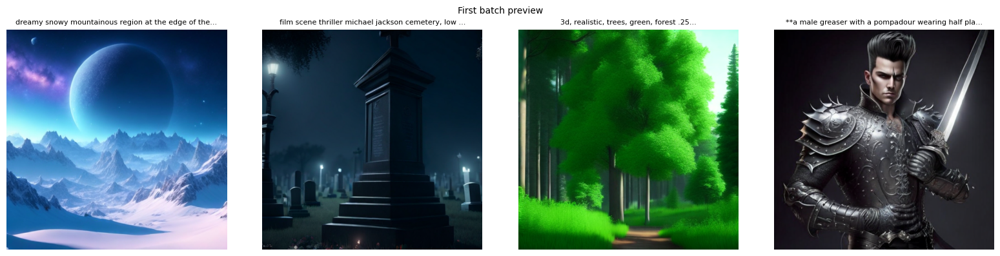

Generated 5000 images. Dataset ready!


In [ ]:
import glob
captions_path = os.path.join(DATA_DIR, "captions.json")
if os.path.exists(captions_path):
    old_captions = json.load(open(captions_path))
    if len(old_captions) < NUM_SAMPLES:
        print(f"Previous generation incomplete ({len(old_captions)}/{NUM_SAMPLES}), clearing...")
        os.remove(captions_path)
        for f in glob.glob(os.path.join(DATA_DIR, "images", "*.jpg")):
            os.remove(f)

prompts_file = os.path.join(DATA_DIR, "prompts_to_generate.json")
if os.path.exists(prompts_file) and not os.path.exists(captions_path):
    print(f"Generating {NUM_SAMPLES} images with teacher model (30 steps)...")
    
    with open(prompts_file, 'r') as f:
        prompts = json.load(f)
    
    images_dir = os.path.join(DATA_DIR, "images")
    os.makedirs(images_dir, exist_ok=True)
    
    model.eval()
    model.to('cuda')
    device = model.vae.device
    captions = {}

    original_fxn = patch_openclip_encoder(model)
    
    test_prompts = prompts[:2] if len(prompts) >= 2 else prompts
    with torch.no_grad():
        tok = model.tokenizer.tokenize(test_prompts)
        emb = model.text_encoder.encode(tok['input_ids'].to(device))[0]
        if len(emb) > 1:
            diff = (emb[0] - emb[1]).abs().mean().item()
            print(f"Sanity check: embedding diff = {diff:.6f} (should be > 0.01)")
    
    batch_size_gen = 4
    
    try:
        for batch_start in tqdm(range(0, min(NUM_SAMPLES, len(prompts)), batch_size_gen), desc="Generating"):
            batch_end = min(batch_start + batch_size_gen, NUM_SAMPLES, len(prompts))
            batch_prompts = prompts[batch_start:batch_end]
            
            with torch.no_grad():
                images = model.generate(
                    prompt=batch_prompts,
                    num_inference_steps=30,
                    guidance_scale=5.0,
                    seed=SEED + batch_start,
                )
            
            for j, prompt in enumerate(batch_prompts):
                idx = batch_start + j
                fname = f"{idx:06d}.jpg"
                img_np = (images[j].cpu().permute(1, 2, 0).numpy() * 255).astype('uint8')
                Image.fromarray(img_np).save(os.path.join(images_dir, fname), quality=95)
                captions[fname] = prompt
            
            if batch_start == 0:
                fig, axes = plt.subplots(1, len(batch_prompts), figsize=(4 * len(batch_prompts), 4))
                if len(batch_prompts) == 1:
                    axes = [axes]
                for j in range(len(batch_prompts)):
                    axes[j].imshow((images[j].cpu().permute(1, 2, 0).numpy() * 255).astype('uint8'))
                    axes[j].axis('off')
                    axes[j].set_title(batch_prompts[j][:50] + '...', fontsize=8)
                plt.suptitle("First batch preview", fontsize=10)
                plt.tight_layout()
                plt.show()
    finally:
        if original_fxn is not None:
            model.text_encoder.encoder.forward_fxn = original_fxn
    
    with open(os.path.join(DATA_DIR, "captions.json"), 'w') as f:
        json.dump(captions, f, indent=2, ensure_ascii=False)
    print(f"Generated {len(captions)} images. Dataset ready!")
else:
    if os.path.exists(os.path.join(DATA_DIR, "captions.json")):
        n = len(json.load(open(os.path.join(DATA_DIR, "captions.json"))))
        print(f"Dataset already exists: {n} images. Skipping generation.")
    else:
        print("No prompts file found. Run the data preparation cell first.")

In [81]:
_ = patch_openclip_encoder(model)

teacher_dit = copy.deepcopy(model.dit)
teacher_dit.requires_grad_(False)
teacher_dit.eval()

student_dit = model.dit
student_dit.train()

model.vae.requires_grad_(False)
model.text_encoder.requires_grad_(False)

vae = model.vae
text_encoder = model.text_encoder
tokenizer = model.tokenizer
edm_config = model.edm_config
latent_scale = model.latent_scale

print(f"sigma_min={edm_config.sigma_min}, sigma_max={edm_config.sigma_max}, sigma_data={edm_config.sigma_data}")

OpenCLIP transformer: batch_first=True
Patched OpenCLIP forward_fxn (causal mask preserved)
sigma_min=0.002, sigma_max=80, sigma_data=0.9


## Training

In [82]:
set_seed(SEED)

accelerator = Accelerator(
    mixed_precision=MIXED_PRECISION,
    gradient_accumulation_steps=GRADIENT_ACCUMULATION_STEPS,
)
weight_dtype = torch.float16 if MIXED_PRECISION == "fp16" else torch.bfloat16

optimizer = torch.optim.AdamW(student_dit.parameters(), lr=LEARNING_RATE, betas=(0.9, 0.999), eps=1e-8)
lr_scheduler = get_scheduler(LR_SCHEDULER_TYPE, optimizer=optimizer,
                              num_warmup_steps=LR_WARMUP_STEPS, num_training_steps=MAX_TRAIN_STEPS)

student_dit, optimizer, lr_scheduler = accelerator.prepare(student_dit, optimizer, lr_scheduler)

device = accelerator.device
teacher_dit.to(device, dtype=weight_dtype)
vae.to(device)
text_encoder.to(device, dtype=weight_dtype)

sigmas = get_sigmas(NUM_TIMESTEPS, sigma_min=edm_config.sigma_min,
                    sigma_max=edm_config.sigma_max, rho=edm_config.rho, device=device)

print(f"device={device}, effective_bs={TRAIN_BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS}")
print(f"lr_scheduler={LR_SCHEDULER_TYPE}, sigmas: {NUM_TIMESTEPS} steps, [{sigmas[0]:.2f} -> {sigmas[-1]:.4f}]")

device=cuda, effective_bs=8
lr_scheduler=cosine, sigmas: 50 steps, [80.00 -> 0.0020]


In [83]:
from torchvision.utils import save_image

def _get_validation_prompts(step):
    prompts = list(VALIDATION_PROMPTS)
    if VALIDATION_RANDOM_N > 0:
        captions_path = os.path.join(DATA_DIR, "captions.json")
        if os.path.exists(captions_path):
            import json
            rng = np.random.default_rng(SEED + step)
            captions = list(json.load(open(captions_path)).values())
            if len(captions) >= VALIDATION_RANDOM_N:
                prompts += list(rng.choice(captions, size=VALIDATION_RANDOM_N, replace=False))
    return prompts

@torch.no_grad()
def validate(step):
    student = accelerator.unwrap_model(student_dit)
    student.eval()
    val_dir = os.path.join(OUTPUT_DIR, f"val_{step}")
    os.makedirs(val_dir, exist_ok=True)
    prompts = _get_validation_prompts(step)
    for i, prompt in enumerate(prompts):
        imgs = generate_images(student, model, [prompt]*2, num_steps=4, seed=SEED+step+i, device=device)
        save_image(imgs, os.path.join(val_dir, f"p{i}.png"), nrow=2)
    student.train()
    print(f"  val images -> {val_dir} (n_prompts={len(prompts)})")

In [84]:
train_dataloader = get_dataloader(DATA_DIR, resolution=RESOLUTION, batch_size=TRAIN_BATCH_SIZE)
train_iter = iter(train_dataloader)

Loaded 5000 image-caption pairs from /kaggle/working/data/journeydb_subset


In [85]:
from functools import partial
from cd_utils import get_sigmas, edm_forward
import torch.nn.functional as F

def cd_loss(
    student_dit, teacher_dit, edm_config,
    latents, text_emb,
    sigmas, guidance_scale,
    loss_type='huber', huber_c=0.001,
    weight_dtype=torch.float16
):
    bsz = latents.shape[0]
    device = latents.device
    N = len(sigmas)
    index = torch.randint(0, N - 1, (bsz,), device=device)
    sigma_s = sigmas[index]
    sigma_t = sigmas[index + 1]
    noise = torch.randn_like(latents)
    x_s = latents + sigma_s.view(-1, 1, 1, 1) * noise

    student_pred = edm_forward(
        x_s, sigma_s, text_emb,
        student_dit.forward_without_cfg,
        edm_config
    )

    with torch.no_grad(), torch.cuda.amp.autocast(dtype=weight_dtype):
        teacher_denoised = edm_forward(
            x_s.to(weight_dtype),
            sigma_s.to(weight_dtype),
            text_emb.to(weight_dtype),
            partial(teacher_dit.forward, cfg=guidance_scale),
            edm_config
        )
        d = (x_s.to(weight_dtype) - teacher_denoised) / sigma_s.view(-1, 1, 1, 1).to(weight_dtype)
        x_t = x_s.to(weight_dtype) + (sigma_t - sigma_s).view(-1, 1, 1, 1).to(weight_dtype) * d

    with torch.no_grad():
        target = edm_forward(
            x_t.float(), sigma_t, text_emb,
            student_dit.forward_without_cfg,
            edm_config
        )

    if loss_type == "l2":
        loss = F.mse_loss(student_pred.float(), target.float())
    elif loss_type == "huber":
        loss = (torch.sqrt((student_pred.float() - target.float()) ** 2 + huber_c ** 2) - huber_c).mean()
    else:
        raise ValueError(f"Unknown loss type: {loss_type}")
    return loss

In [86]:
losses = []
progress_bar = tqdm(range(MAX_TRAIN_STEPS), desc="CD Training")

for step in progress_bar:
    batch = next(train_iter)
    images = batch['image'].to(device)
    captions = batch['caption']

    with torch.no_grad():
        latents = vae.encode(images)['latent_dist'].sample().data * latent_scale
        tokens = tokenizer.tokenize(captions)['input_ids'].to(device)
        text_emb = text_encoder.encode(tokens)[0]

    with accelerator.accumulate(student_dit):
        student = accelerator.unwrap_model(student_dit)
        loss = cd_loss(
            student, teacher_dit, edm_config,
            latents.float(), text_emb.float(),
            sigmas, GUIDANCE_SCALE,
            loss_type=LOSS_TYPE, huber_c=HUBER_C, weight_dtype=weight_dtype
        )
        accelerator.backward(loss)
        if accelerator.sync_gradients:
            accelerator.clip_grad_norm_(student_dit.parameters(), MAX_GRAD_NORM)
        optimizer.step()
        lr_scheduler.step()
        optimizer.zero_grad(set_to_none=True)

    loss_val = loss.detach().item()
    losses.append(loss_val)
    progress_bar.set_postfix(loss=f"{loss_val:.4f}", lr=f"{lr_scheduler.get_last_lr()[0]:.2e}")

    if (step + 1) % VALIDATION_STEPS == 0:
        print(f"\nstep {step+1}, avg_loss={np.mean(losses[-VALIDATION_STEPS:]):.4f}")
        validate(step + 1)

    if (step + 1) % SAVE_STEPS == 0:
        ckpt = os.path.join(OUTPUT_DIR, f"student_step_{step+1}.pt")
        torch.save(accelerator.unwrap_model(student_dit).state_dict(), ckpt)
        print(f"  saved {ckpt}")

final_ckpt = os.path.join(OUTPUT_DIR, "student_dit_final.pt")
torch.save(accelerator.unwrap_model(student_dit).state_dict(), final_ckpt)
print(f"Done. Final checkpoint: {final_ckpt}")

CD Training:   0%|          | 0/10000 [00:00<?, ?it/s]

/tmp/ipykernel_488/202610456.py:29: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(dtype=weight_dtype):



step 500, avg_loss=0.0374
  val images -> /kaggle/working/output/val_500 (n_prompts=8)

step 1000, avg_loss=0.0509
  val images -> /kaggle/working/output/val_1000 (n_prompts=8)

step 1500, avg_loss=0.0503
  val images -> /kaggle/working/output/val_1500 (n_prompts=8)

step 2000, avg_loss=0.0498
  val images -> /kaggle/working/output/val_2000 (n_prompts=8)

step 2500, avg_loss=0.0496
  val images -> /kaggle/working/output/val_2500 (n_prompts=8)

step 3000, avg_loss=0.0486
  val images -> /kaggle/working/output/val_3000 (n_prompts=8)

step 3500, avg_loss=0.0467
  val images -> /kaggle/working/output/val_3500 (n_prompts=8)

step 4000, avg_loss=0.0433
  val images -> /kaggle/working/output/val_4000 (n_prompts=8)

step 4500, avg_loss=0.0466
  val images -> /kaggle/working/output/val_4500 (n_prompts=8)

step 5000, avg_loss=0.0437
  val images -> /kaggle/working/output/val_5000 (n_prompts=8)

step 5500, avg_loss=0.0439
  val images -> /kaggle/working/output/val_5500 (n_prompts=8)

step 6000, 

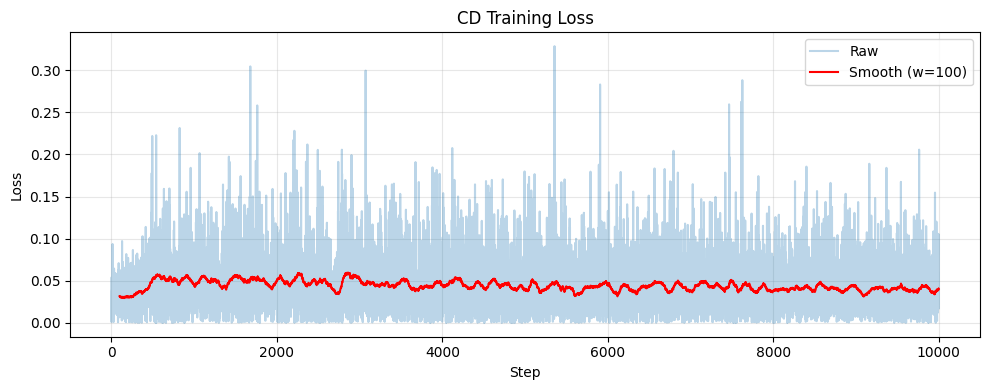

In [87]:
plt.figure(figsize=(10, 4))
plt.plot(losses, alpha=0.3, label='Raw')
w = min(100, len(losses) // 5)
if w > 1:
    sm = np.convolve(losses, np.ones(w)/w, mode='valid')
    plt.plot(range(w-1, len(losses)), sm, label=f'Smooth (w={w})', color='red')
plt.xlabel('Step'); plt.ylabel('Loss'); plt.title('CD Training Loss')
plt.legend(); plt.grid(alpha=0.3); plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'loss.png'), dpi=150)
plt.show()

In [90]:
os.remove("/kaggle/working/output/student_dit_final.pt")

## Inference

In [99]:
model.dit.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "student_step_10000.pt"), map_location='cpu'))
student_dit = model.dit

student = accelerator.unwrap_model(student_dit)
student.eval()
student.to(device)

DiT(
  (x_embedder): PatchEmbed(
    (proj): Conv2d(4, 1024, kernel_size=(2, 2), stride=(2, 2))
    (norm): Identity()
  )
  (t_embedder): TimestepEmbedder(
    (mlp): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): GELU(approximate='tanh')
      (2): Linear(in_features=1024, out_features=1024, bias=True)
    )
  )
  (y_embedder): CaptionProjection(
    (y_proj): Mlp(
      (fc1): Linear(in_features=1024, out_features=1024, bias=True)
      (act): GELU(approximate='tanh')
      (norm): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (fc2): Linear(in_features=1024, out_features=1024, bias=True)
    )
  )
  (y_emb_preprocess): AttentionBlockPromptEmbedding(
    (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
    (attn): SelfAttention(
      (qkv): Linear(in_features=1024, out_features=3072, bias=False)
      (proj): Linear(in_features=1024, out_features=1024, bias=False)
      (ln_q): LayerNorm((1024,), eps=1e-06, eleme

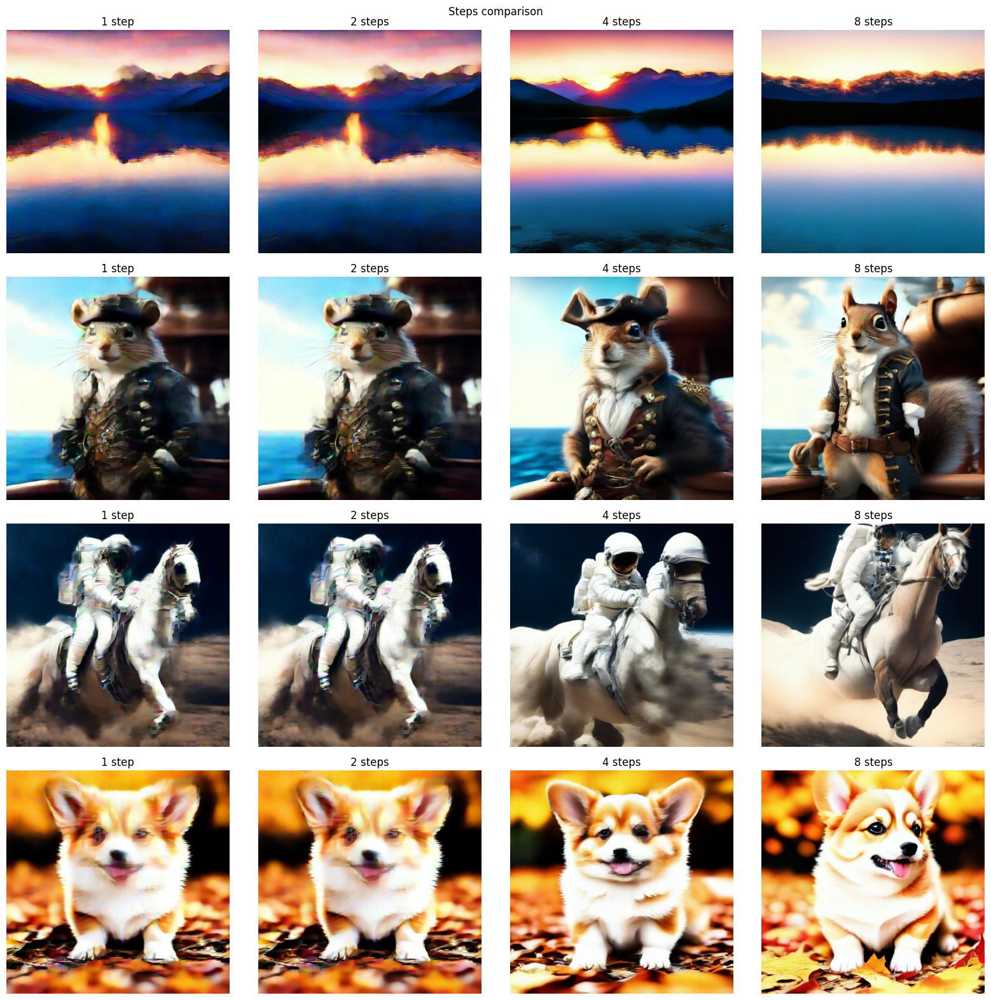

In [100]:
test_prompts = [
    "A beautiful sunset over mountains with a clear lake",
    "An elegant squirrel pirate on a ship",
    "A photo of an astronaut riding a horse",
    "A cute corgi puppy playing in autumn leaves",
]

fig, axes = plt.subplots(len(test_prompts), 4, figsize=(16, 4*len(test_prompts)))
for row, prompt in enumerate(test_prompts):
    for col, n_steps in enumerate([1, 2, 4, 8]):
        imgs = generate_images(student, model, [prompt], num_steps=n_steps, seed=SEED, device=device)
        axes[row, col].imshow(imgs[0].cpu().permute(1,2,0).numpy())
        axes[row, col].set_title(f"{n_steps} step{'s' if n_steps>1 else ''}")
        axes[row, col].axis('off')
plt.suptitle('Steps comparison'); plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'steps.png'), dpi=150, bbox_inches='tight')
plt.show()

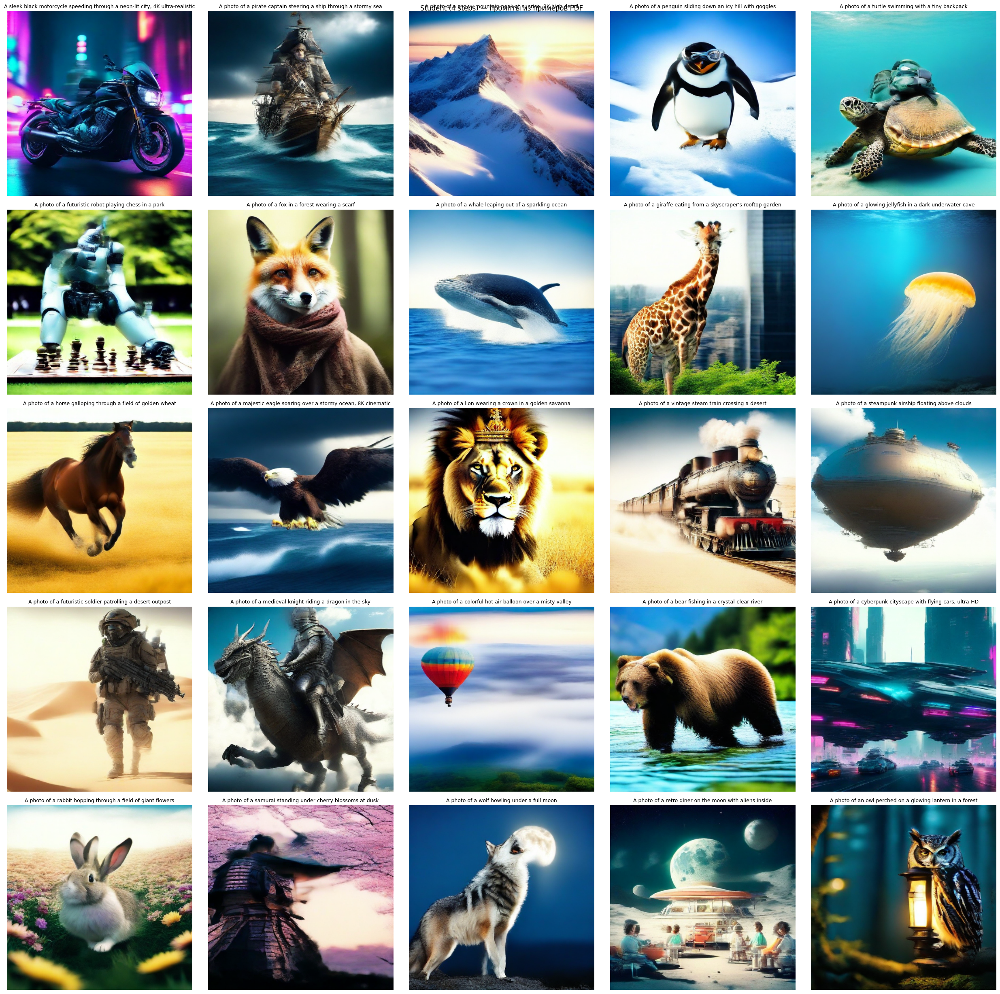

In [101]:
PDF_EXAMPLE_PROMPTS = [
    "A sleek black motorcycle speeding through a neon-lit city, 4K ultra-realistic",
    "A photo of a pirate captain steering a ship through a stormy sea",
    "A photo of a snowy mountain peak at sunrise, 8K high detail",
    "A photo of a penguin sliding down an icy hill with goggles",
    "A photo of a turtle swimming with a tiny backpack",
    "A photo of a futuristic robot playing chess in a park",
    "A photo of a fox in a forest wearing a scarf",
    "A photo of a whale leaping out of a sparkling ocean",
    "A photo of a giraffe eating from a skyscraper's rooftop garden",
    "A photo of a glowing jellyfish in a dark underwater cave",
    "A photo of a horse galloping through a field of golden wheat",
    "A photo of a majestic eagle soaring over a stormy ocean, 8K cinematic",
    "A photo of a lion wearing a crown in a golden savanna",
    "A photo of a vintage steam train crossing a desert",
    "A photo of a steampunk airship floating above clouds",
    "A photo of a futuristic soldier patrolling a desert outpost",
    "A photo of a medieval knight riding a dragon in the sky",
    "A photo of a colorful hot air balloon over a misty valley",
    "A photo of a bear fishing in a crystal-clear river",
    "A photo of a cyberpunk cityscape with flying cars, ultra-HD",
    "A photo of a rabbit hopping through a field of giant flowers",
    "A photo of a samurai standing under cherry blossoms at dusk",
    "A photo of a wolf howling under a full moon",
    "A photo of a retro diner on the moon with aliens inside",
    "A photo of an owl perched on a glowing lantern in a forest",
]

try:
    _ = student
except NameError:
    student = accelerator.unwrap_model(student_dit)
student.eval()
n_p = len(PDF_EXAMPLE_PROMPTS)
n_cols = 5
n_rows = (n_p + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()
for i in range(len(axes)):
    axes[i].axis("off")
with torch.no_grad():
    for idx, prompt in enumerate(PDF_EXAMPLE_PROMPTS):
        imgs = generate_images(student, model, [prompt], num_steps=4, seed=SEED + idx, device=device)
        axes[idx].imshow(imgs[0].cpu().permute(1, 2, 0).numpy())
        axes[idx].set_title(prompt[:80] + ("..." if len(prompt) > 80 else ""), fontsize=9)
        axes[idx].axis("off")
plt.suptitle("Student (4 steps) — промпты из примеров PDF", fontsize=12)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "pdf_example_prompts_quality.png"), dpi=150, bbox_inches="tight")
plt.show()

## PartiPrompts Benchmark

In [102]:
results = run_parti_prompts_benchmark(
    student, model,
    tsv_path="PartiPrompts.tsv",
    output_dir=os.path.join(OUTPUT_DIR, "parti_prompts_4steps"),
    num_steps=4, num_prompts=200, batch_size=4, seed=2024, device=device,
)
print(f"Generated {len(results)} images")

PartiPrompts:   0%|          | 0/50 [00:00<?, ?it/s]

Generated 200 images in /kaggle/working/output/parti_prompts_4steps
Generated 200 images


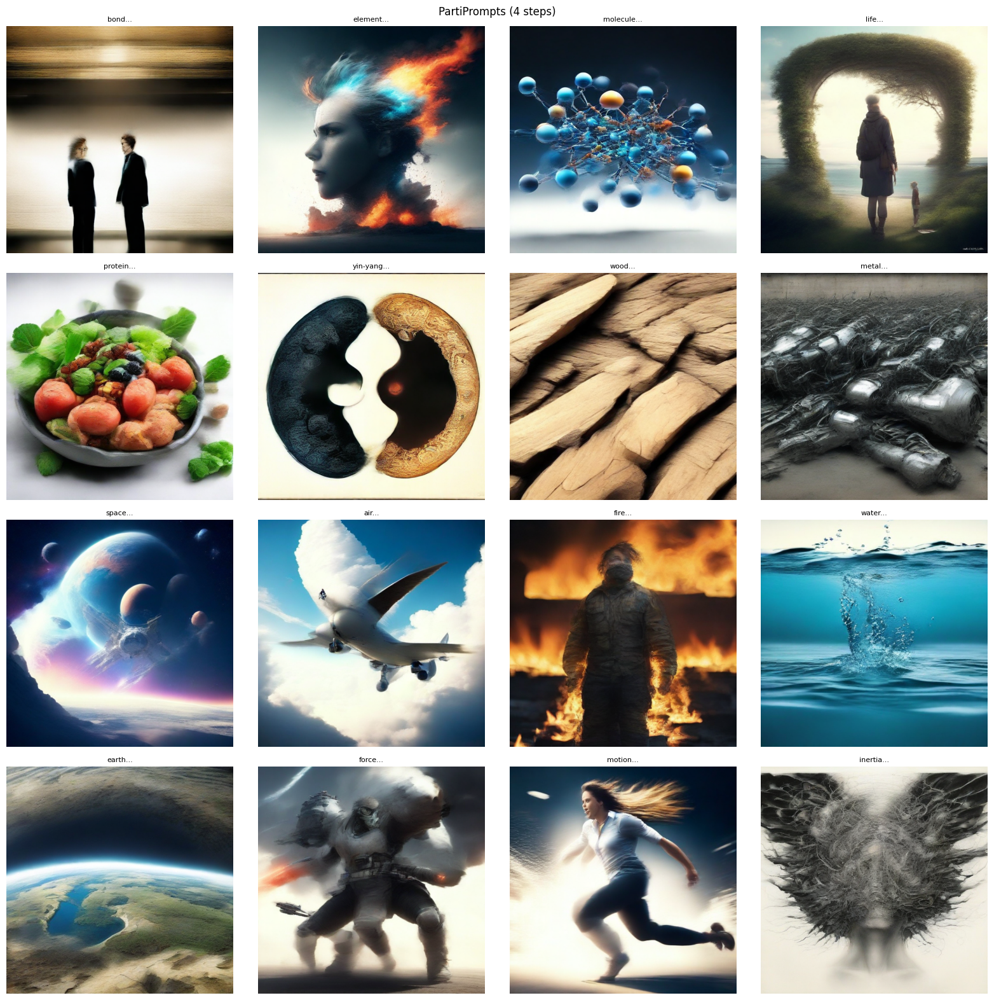

In [103]:
from PIL import Image

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
for idx, (prompt, img_path) in enumerate(results[:16]):
    r, c = idx // 4, idx % 4
    axes[r, c].imshow(Image.open(img_path))
    axes[r, c].set_title(prompt[:50] + '...', fontsize=8)
    axes[r, c].axis('off')
plt.suptitle('PartiPrompts (4 steps)'); plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'parti_grid.png'), dpi=150, bbox_inches='tight')
plt.show()

In [104]:
import shutil

parti_dir = "/kaggle/working/output/parti_prompts_4steps"
zip_path = "/kaggle/working/parti_prompts_4steps.zip"

if os.path.exists(zip_path):
    os.remove(zip_path)
if os.path.exists(parti_dir):
    shutil.make_archive("/kaggle/working/parti_prompts_4steps", "zip", "/kaggle/working/output", "parti_prompts_4steps")